**Author:** Elias Rafael Ruiz-Morales

**Institution:** Wellcome Sanger institute

**November, 2022**

Plots for the Paper


---

# Fine annotation of Fibroblasts and endothelials

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata

import seaborn as sns 

import matplotlib.pyplot as plt
import matplotlib as mpl
import gc


In [3]:

#For TF-IDF
import episcanpy as epi
from sklearn.feature_extraction.text import TfidfTransformer

### Note 
To run this chunk you need:

*rpy2==3.4.2  ///  anndata2ri==1.0.6*

In [ ]:
#Import in this order
import rpy2.robjects.numpy2ri
import rpy2.rinterface_lib.callbacks
import logging
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
rpy2.robjects.numpy2ri.activate()

import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

In [2]:
for folder in ['../results/images/integrated/','../results/images/integrated/fibroblastsEndof/']:
    if not os.path.exists(folder):
        os.makedirs(folder)
        #loop over the subfolders of the rawdata folder

In [3]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/fibroblastsEndof/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiwisolver          1.3.1


'/opt/conda/bin/python'

In [4]:
def identityTransfer(adata_CellsNewID, adata, field='cell_type'):
    
    '''
    Function to transfer the value in a .obs column, modifying only the cells included in adata_CellsNewID
    
    Parameters:
        adata_CellsNewID: anndata object with cells. These should have in their .obs[field] the new values to be transfer to adata
        adata: anndata object to modify. The value in .obs[field] will be modifies for all the cells in adata_CellsNewID
        field: column name in .obs to operate in.
        
     Return:
        anndata object with the metadata modified
        
    '''
    
    #converting categorical into strings to introduce new categories
    adata.obs[field]=adata.obs[field].astype("string")


    #assigning the new categories to the cells in adata
    for cell in adata_CellsNewID.obs.index:
        adata.obs[field][cell] = adata_CellsNewID.obs[field][cell]

    #Returning strings into categorical 
    adata.obs[field]=adata.obs[field].astype("category")
    
    return(adata)

In [5]:
def runTF_IDF(adata, groupby, method='wilcoxon'):
    
    '''
    Function to run TF-IDF and DE analysis. TF-IDF means term-frequency times inverse document-frequency. 
    Its goal is to scale down the impact of tokens that occur very frequently (i.e. less informative)
    than features that occur in a small fraction of the training corpus.
    The the function applies a DE analysis.
    
    Parameters:
        adata: anndata object with cells.
        groupby: column name in .obs to make the DE comparison.
        method: method to use for Differential expression.
    
    Return:
        anndata object with the DE genes stored in adata.uns['rank_genes_groups']
        
    '''
    
    
    counts = anndata.AnnData(X=adata.X, var=adata.var, obs=adata.obs, asview=False)


    #-- Binarize counts matrix (1 if expressed, 0 otherwise)
    adata_bin = epi.pp.binarize(counts, copy=True)
    adata_bin.X.shape


    #-- Compute TF-IDF
    transformer = TfidfTransformer()
    tfidf = transformer.fit_transform(adata_bin.X.T)
    adata_bin.X = tfidf.T
    adata_bin.X.shape


    #-- Compute Mann-Withney test with scanpy
    sc.tl.rank_genes_groups(adata_bin, groupby= groupby, use_raw=False, method=method)

    return(adata_bin)

In [6]:
def Barplot(which_var, adata, var='identity', height=3, color = False, suffix= '', fig_format='svg'):
    
    '''
    Function to plot barplots plotting the proportion of cells per catergory in var, coming from each category in which_var.
    
    Parameters:
        which_var: column name in .obs. Contains the categories to contrast.
        adata: anndata object.
        var: column name in .obs. It contains the categories of the cells.
        height: plot height
        color: colors to use
        suffix: string. Suffix to be added at the end of the name of the plot.
    
    Return:
        Saves bar plot as a pdf.
        
    '''
    
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    ax1.set_xlim(0, 100)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+ suffix+'.'+fig_format, bbox_inches='tight',
                       dpi=300, orientation='landscape', format= fig_format, optimize=True)

## Loading data

In [7]:
adata= sc.read('../results/scVI/rna7_scVIintegrated_latent30_All_20230707.h5ad')


In [8]:
del(adata.raw)

In [9]:
adata.X=adata.layers['raw_counts'].copy()

In [10]:
#Normalize and scale data to run neirest neighbors and plot gene expression
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:02)


### Setting up color palette for future plots

In [11]:
sc.set_figure_params(figsize=(5,5))

In [12]:
#DF with the row names as the identity of the cells
colors_final_df = pd.DataFrame(index = np.unique(adata.obs['cell_type']))


#Assign each color per cell type under the column color
colors_final_df.loc['VCT', 'color'] = '#b27ab4'
colors_final_df.loc['VCT_fusing', 'color'] = '#b53179'
colors_final_df.loc['VCT_p', 'color'] = '#993f98'
colors_final_df.loc['VCT_CCC', 'color'] = '#e2a7c8'

colors_final_df.loc['iEVT', 'color'] = '#0069b4'
colors_final_df.loc['EVT_1', 'color'] = '#009999'
colors_final_df.loc['EVT_2', 'color'] = '#03f9f2'


colors_final_df.loc['Endo_f', 'color'] = '#3f752d'
colors_final_df.loc['F', 'color'] = '#6bb300'
colors_final_df.loc['PV', 'color'] = '#d6ff99'

colors_final_df.loc['HBC', 'color'] = '#db5669'
colors_final_df.loc['PAMM1', 'color'] = '#f7e55e'

colors_final_dict= colors_final_df.to_dict()['color']

In [13]:
adata

AnnData object with n_obs × n_vars = 124175 × 36601
    obs: 'sample', 'stage', 'hpi', 'infection', 'percent_mito', 'n_counts', 'sample_barcode', 'assignment_SoC', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'total_counts', 'total_counts_hs', 'pct_counts_hs', 'total_counts_tg', 'pct_counts_tg', 'Tg_infected', 'n_genes', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'celltype_predictions', 'probabilities', 'scrublet_doublet', 'cell_type_2022', 'cell_type', 'souporcell_MFgenotype', 'MFgenotype', 'cell_type_broad', 'umap_density_Tg_infected', 'stage_perInfection', 'celltype-Stage', 'Tg_intracellular', 'celltype-Intracellular'
    var: 'gene_ids', 'feature_types', 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'MFgenotype_colors', '_scvi', 'cell_type

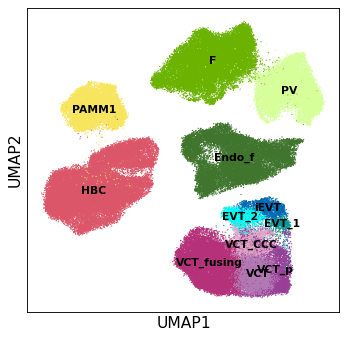

In [14]:
sc.pl.umap(adata, color=['cell_type'], size=5,
           palette= colors_final_dict, title='', legend_loc='on data',legend_fontsize='x-small')

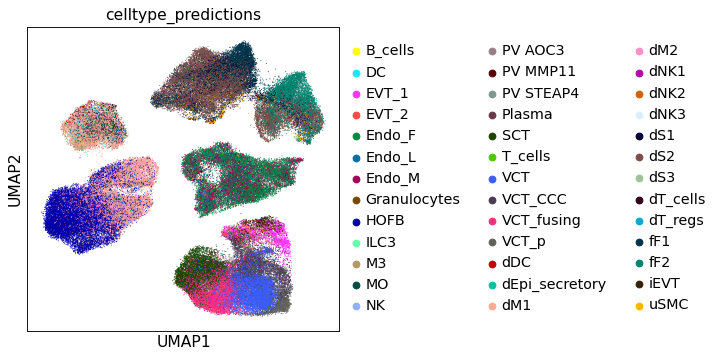

In [15]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['celltype_predictions'], ncols=2, size=3)

In [16]:
#adata.write('../results/scVI/rna7_scVIintegrated_latent30_All_20230707.h5ad')

In [18]:
gc.collect()

9771

### Subsetting Fibroblasts and Endothelial

In [19]:
FibroEndo = adata[adata.obs['cell_type'].isin(['F','PV','Endo_f'])]

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Trying to set attribute `.uns` of view, copying.


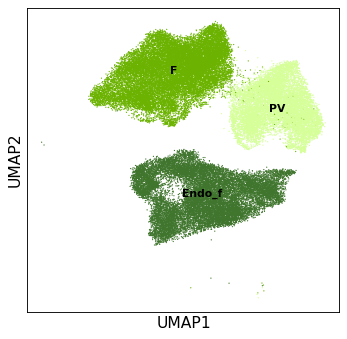

In [20]:
sc.pl.umap(FibroEndo, color=['cell_type'], size=5,
           palette= colors_final_dict, title='', legend_loc='on data',legend_fontsize='x-small')

## Recalculate the UMAP coordinates

In [21]:
#LATENT 30
sc.pp.neighbors(FibroEndo, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(FibroEndo)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:09)


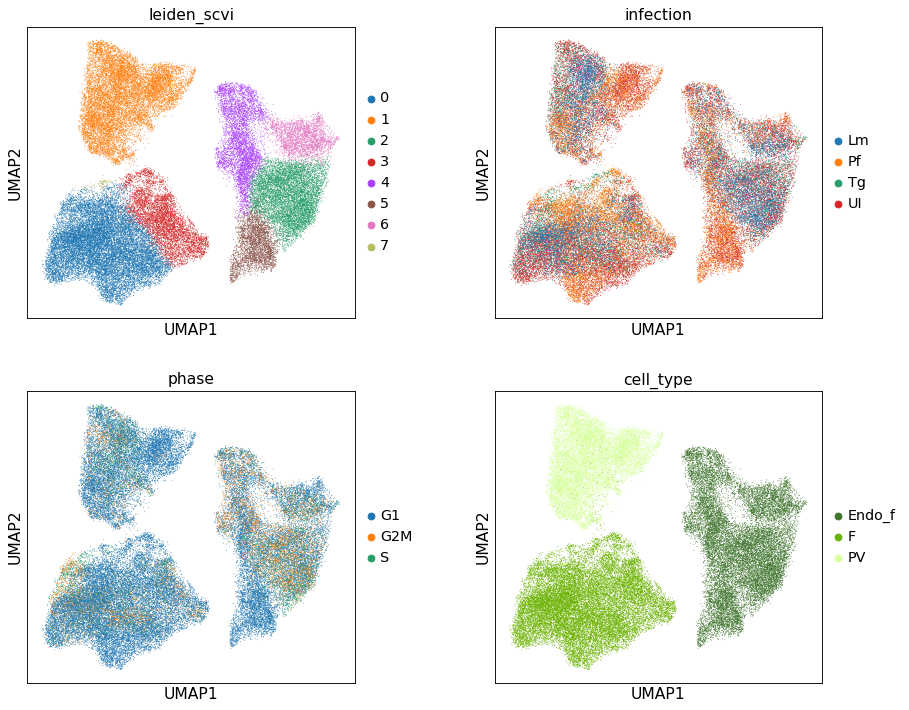

In [22]:
#clustering
sc.tl.leiden(FibroEndo, key_added="leiden_scvi", resolution=0.4)


sc.pl.umap(FibroEndo, color=["leiden_scvi",'infection','phase', 'cell_type'], ncols=2, wspace=0.3)

## Recalculate the UMAP coordinates for Endothelial

In [23]:
Fibro = FibroEndo[FibroEndo.obs['cell_type'].isin(['F','PV'])].copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [24]:
#LATENT 30
sc.pp.neighbors(Fibro, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(Fibro)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


running Leiden clustering
    finished: found 9 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:07)


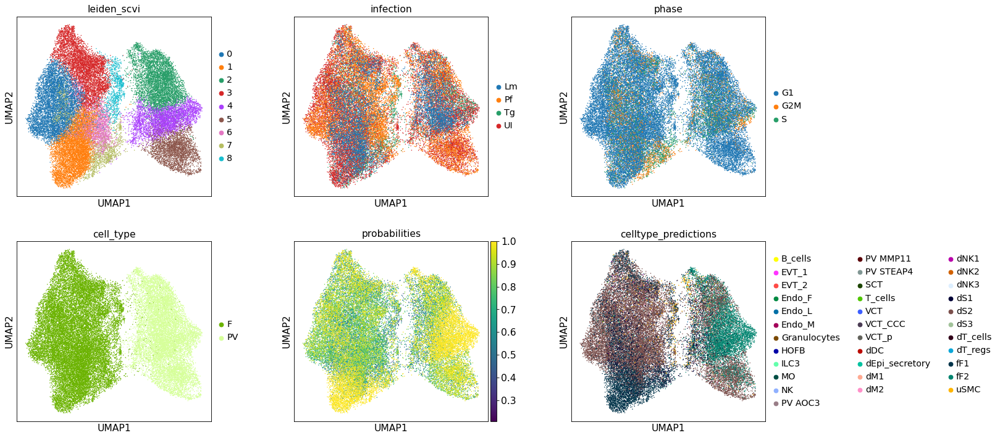

In [25]:

#clustering
sc.tl.leiden(Fibro, key_added="leiden_scvi", resolution=0.5)


sc.pl.umap(Fibro, color=["leiden_scvi",'infection','phase', 'cell_type',
                             'probabilities','celltype_predictions'], ncols=3, wspace=0.3, size=7)

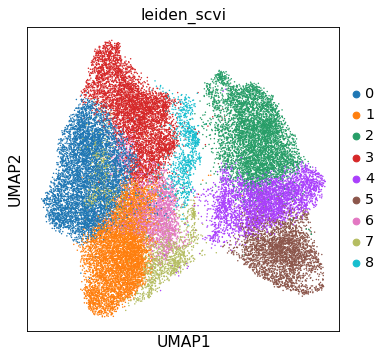

In [26]:

sc.pl.umap(Fibro, color=["leiden_scvi"], ncols=3, wspace=0.3, size=7)

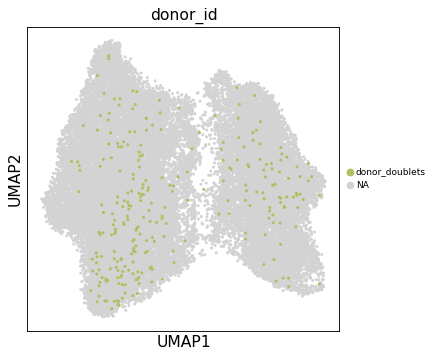

In [27]:
sc.pl.umap(Fibro, color=['donor_id' ], legend_fontsize='xx-small', size=30, ncols=2, groups=['donor_doublets'], )

#sc.pl.umap(Fibro, color=['cell_type_2022' ], legend_fontsize='xx-small', size=30, ncols=2, groups=['nan'], )


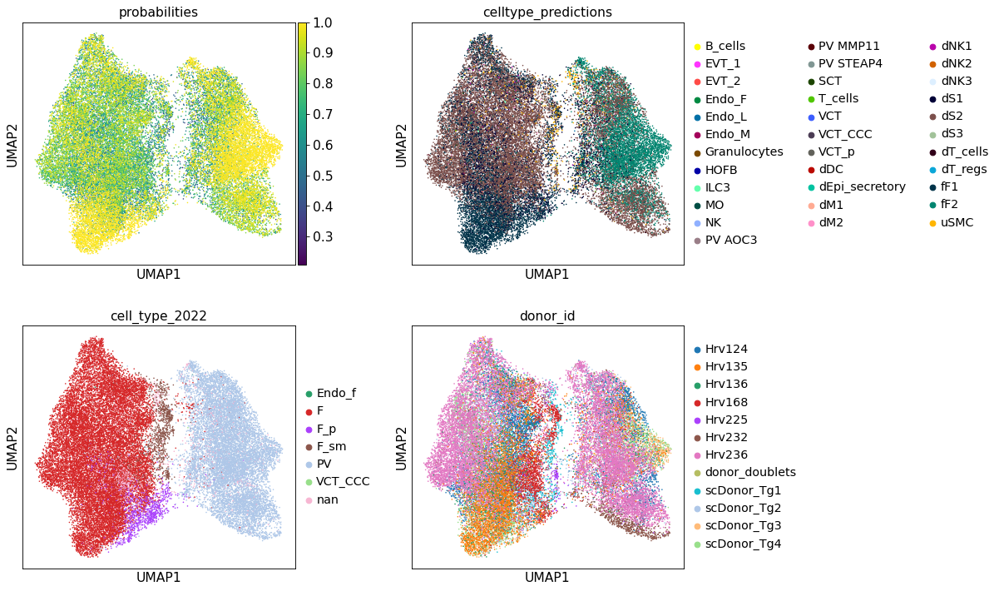

In [28]:
sc.pl.umap(Fibro, color=[ 'probabilities','celltype_predictions', 'cell_type_2022','donor_id'], ncols=2, wspace=0.3, size=8)

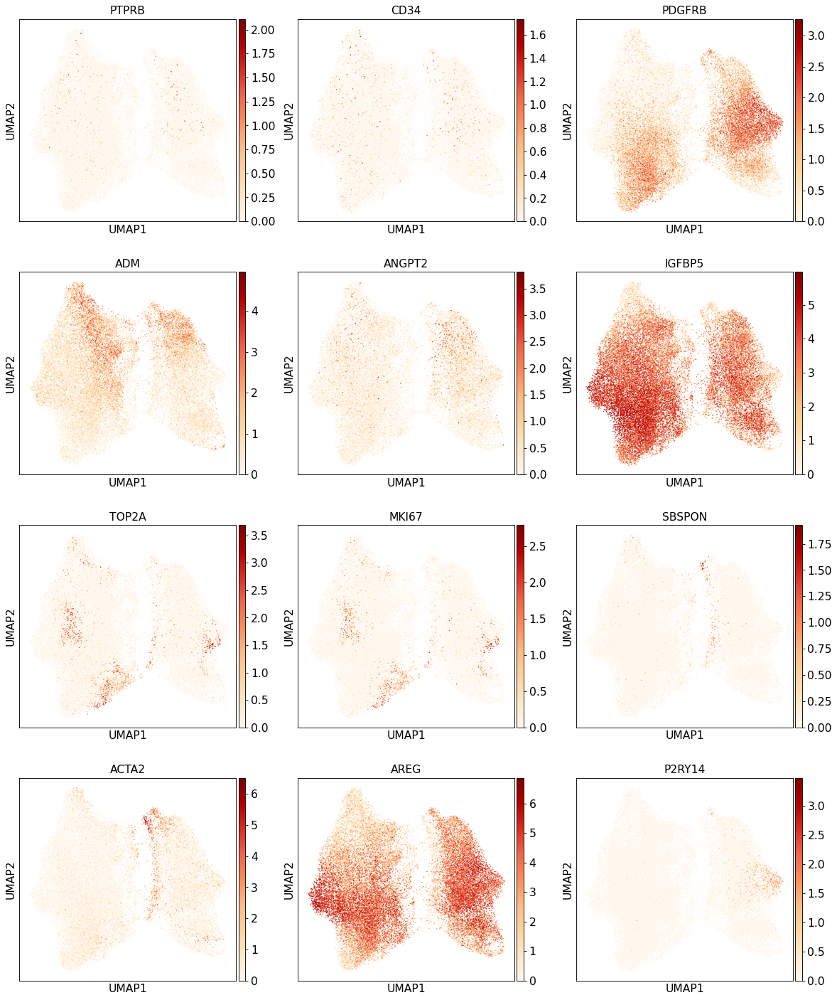

In [29]:
sc.pl.umap(Fibro, color=['PTPRB','CD34',
                         'PDGFRB', # +ACTA2 + IGFBP5 + SBSPON= Smooth muscle / + AREG = Pericyte
                         'ADM','ANGPT2','IGFBP5',
                         #'RSAD2',
                         #'ACKR1', 'CPE',
                         'TOP2A','MKI67', #F proliferating
                         #'GJA5',
                         'SBSPON', 
                         'ACTA2','AREG', 'P2RY14', #Pericytes
                         ], color_map='OrRd', size=6, ncols=3, save='_Fibro_VacularMarkers.pdf')

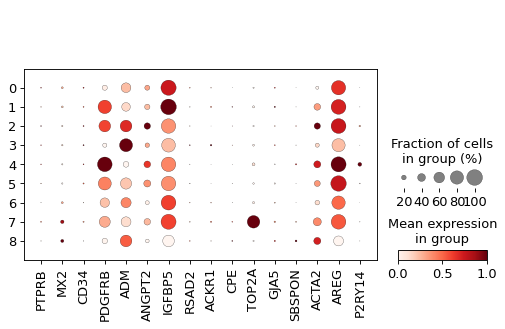

In [30]:

sc.pl.dotplot(Fibro, ['PTPRB','MX2','CD34','PDGFRB', 'ADM','ANGPT2','IGFBP5', 'RSAD2', 'ACKR1', 'CPE', 'TOP2A',
     'GJA5','SBSPON', 'ACTA2','AREG', 'P2RY14'], groupby='leiden_scvi', use_raw=False, standard_scale = 'var')


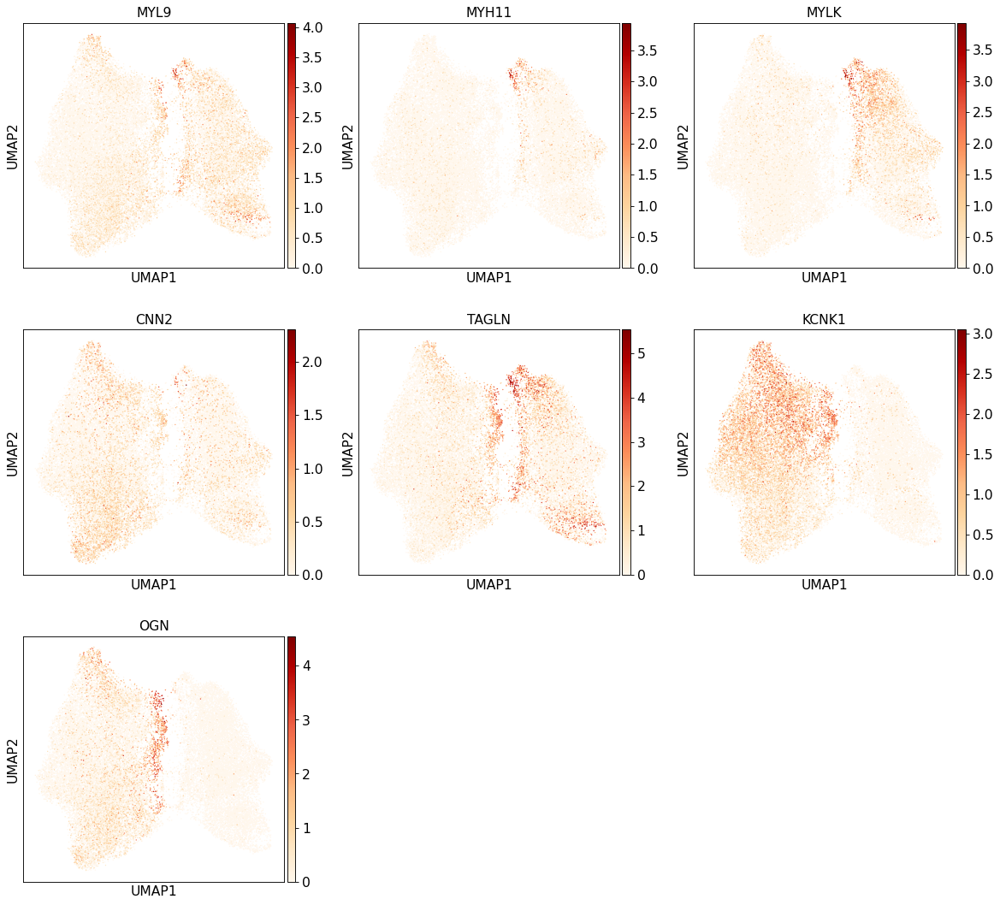

In [31]:
sc.pl.umap(Fibro, color=['MYL9','MYH11','MYLK','CNN2', 'TAGLN','KCNK1','OGN' #F smooth muscle markers
                         ], color_map='OrRd', size=6, ncols=3)

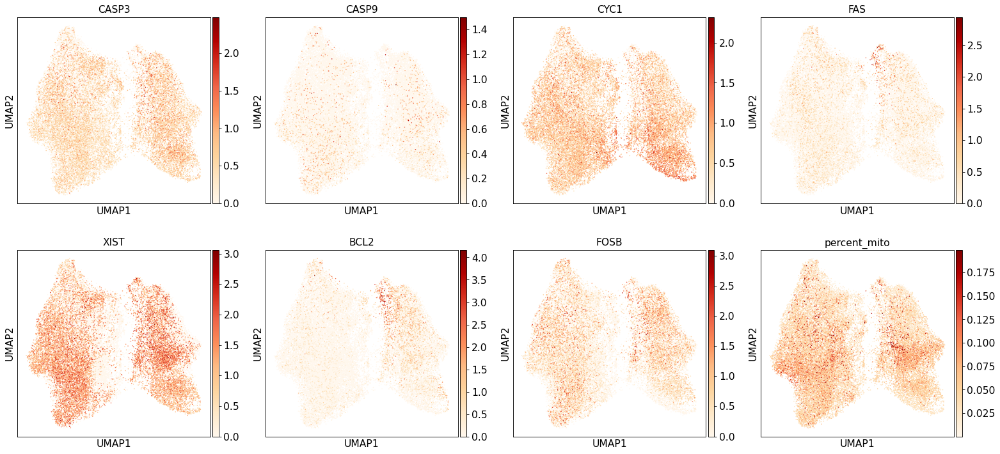

In [32]:
sc.pl.umap(Fibro, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2','FOSB','percent_mito'],
           color_map='OrRd', size=7)

In [33]:
Fibro

AnnData object with n_obs × n_vars = 33813 × 36601
    obs: 'sample', 'stage', 'hpi', 'infection', 'percent_mito', 'n_counts', 'sample_barcode', 'assignment_SoC', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'total_counts', 'total_counts_hs', 'pct_counts_hs', 'total_counts_tg', 'pct_counts_tg', 'Tg_infected', 'n_genes', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'celltype_predictions', 'probabilities', 'scrublet_doublet', 'cell_type_2022', 'cell_type', 'souporcell_MFgenotype', 'MFgenotype', 'cell_type_broad', 'umap_density_Tg_infected', 'stage_perInfection', 'celltype-Stage', 'Tg_intracellular', 'celltype-Intracellular'
    var: 'gene_ids', 'feature_types', 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'MFgenotype_colors', '_scvi', 'cell_type_

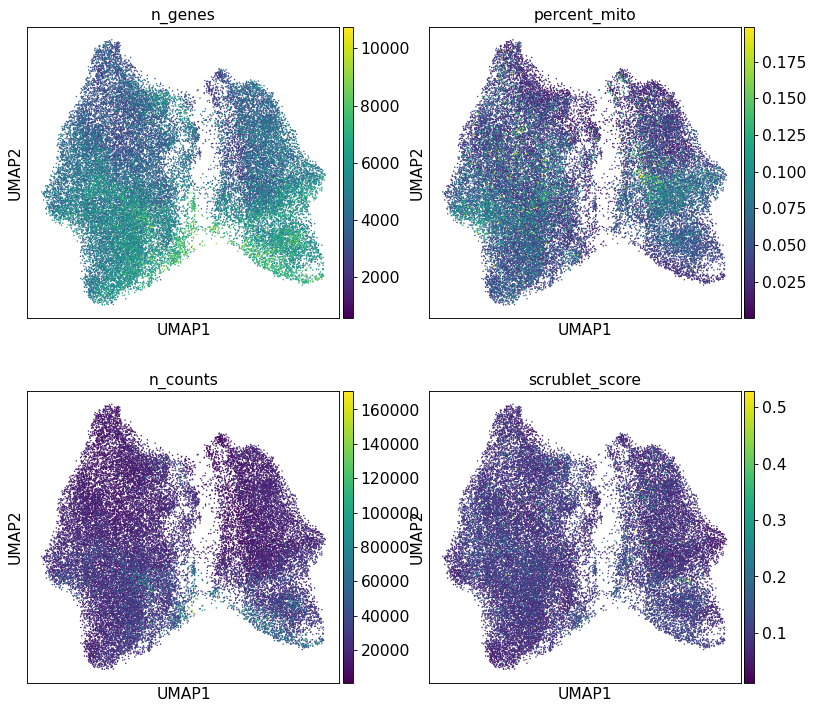

In [34]:
sc.pl.umap(Fibro, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score' ], ncols=2, size=7)

### TF-IDF of fibroblast clusters

In [38]:
Fibro_TFidf= runTF_IDF(Fibro, groupby='leiden_scvi', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:32)


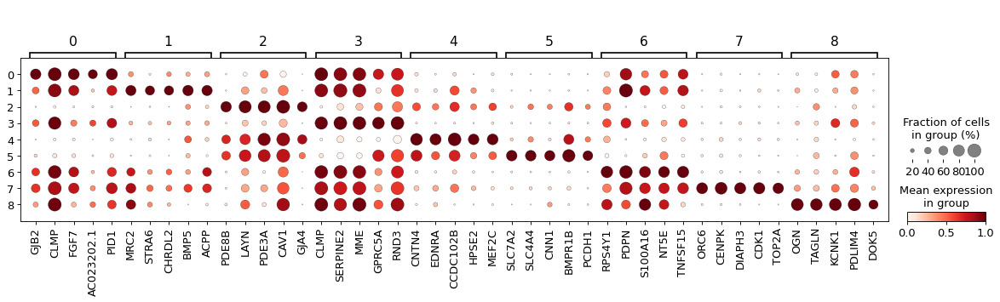

In [39]:
sc.pl.rank_genes_groups_dotplot(Fibro_TFidf, n_genes=5, dendrogram=False,standard_scale='var')

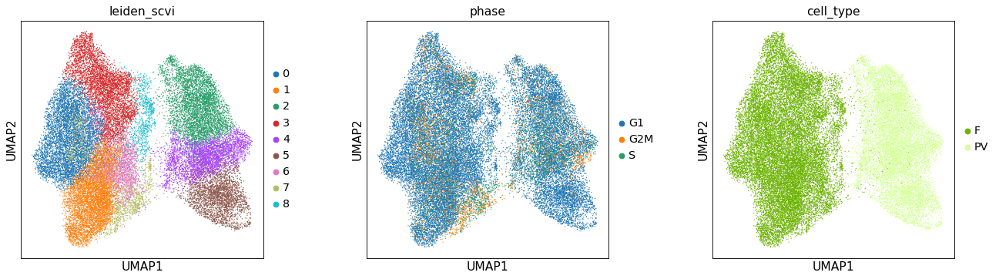

In [35]:
sc.pl.umap(Fibro, color=["leiden_scvi",'phase', 'cell_type'], ncols=3, wspace=0.3, size=5)

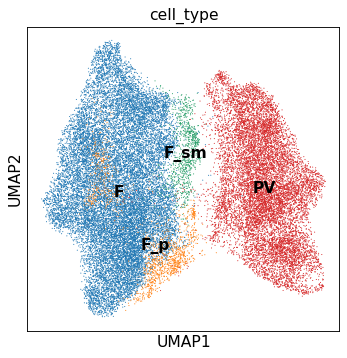

In [36]:
# COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
Fibro.obs['cell_type']= Fibro.obs['leiden_scvi']


#Function that changes the cluster names as indicated
Fibro.obs['cell_type'] = (Fibro.obs["leiden_scvi"].map(lambda x: 
                            {"0": "F", "1": "F", "2": "PV", "3": "F", "4": "PV", "5": "PV",
                            "6": "F", "7": "F_p", "8": "F_sm"}
                            .get(x, x)).astype("category"))


sc.pl.umap(Fibro, color=['cell_type'], wspace=0.3, legend_loc='on data')

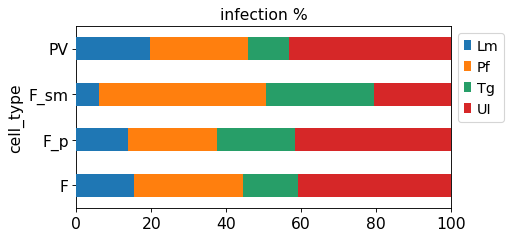

In [44]:
Barplot('infection', Fibro, var= 'cell_type')

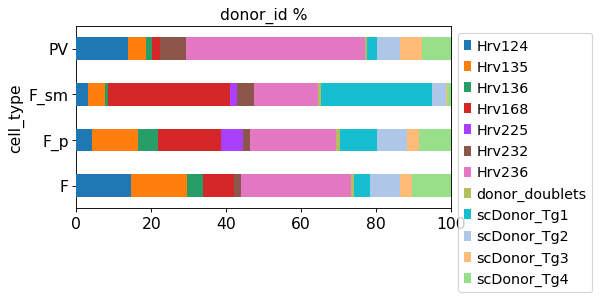

In [45]:
Barplot('donor_id', Fibro, var= 'cell_type')

## Recalculate the UMAP coordinates for Endothelial

In [37]:
Endo = FibroEndo[FibroEndo.obs['cell_type'].isin(['Endo_f'])].copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [38]:
#LATENT 30
sc.pp.neighbors(Endo, n_neighbors=15, use_rep="X_scVI_n_latent_30")
sc.tl.umap(Endo)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


running Leiden clustering
    finished: found 4 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:01)


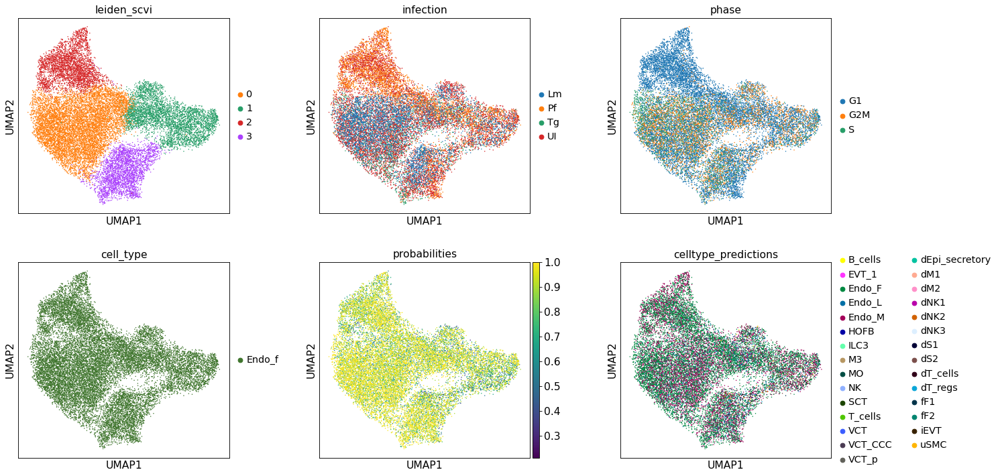

In [39]:

#clustering
sc.tl.leiden(Endo, key_added="leiden_scvi", resolution=0.2)


sc.pl.umap(Endo, color=["leiden_scvi",'infection','phase', 'cell_type',
                             'probabilities','celltype_predictions'], ncols=3, wspace=0.3, size=7)

### TF-IDF for endothelial

In [49]:
Endo_TFidf= runTF_IDF(Endo, groupby='leiden_scvi', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:42)


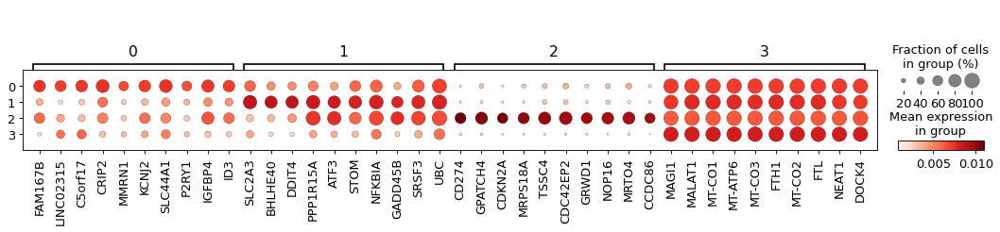

In [50]:
sc.pl.rank_genes_groups_dotplot(Endo_TFidf, n_genes=10, dendrogram=False,)

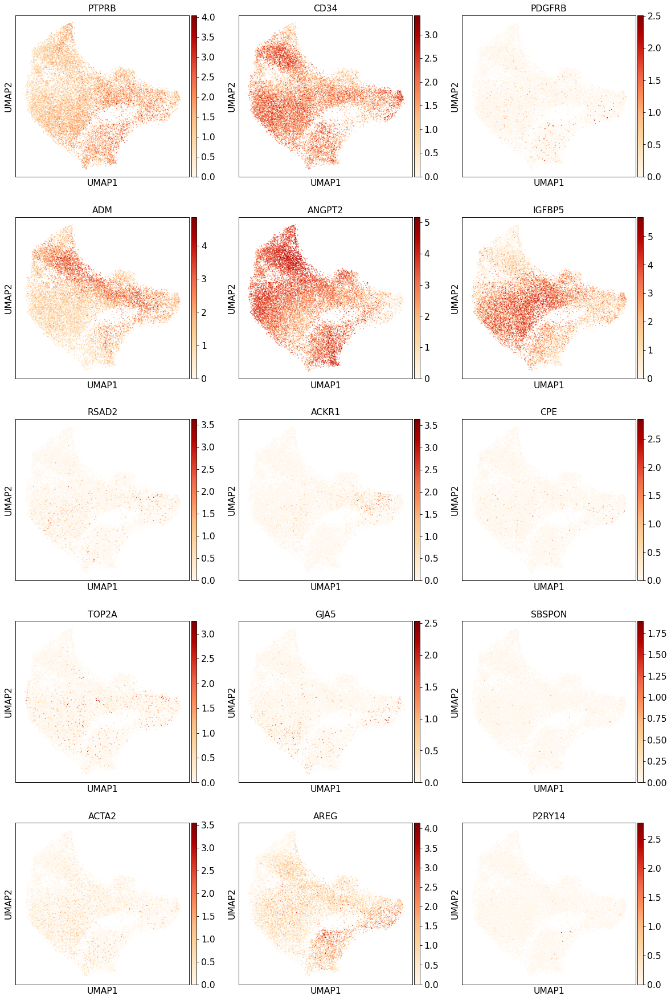

In [40]:
sc.pl.umap(Endo, color=['PTPRB','CD34', #Endothelial
                        'PDGFRB', #pericyte
                       'ADM','ANGPT2','IGFBP5', 
                       'RSAD2',
                       'ACKR1', 
                         'CPE', 'TOP2A',
                       'GJA5',
                         'SBSPON', 
                         'ACTA2','AREG', 'P2RY14',
                         ], color_map='OrRd', ncols=3,size=7, save='_Fibro_VacularMarkers.pdf')

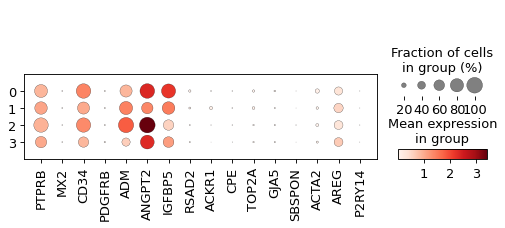

In [41]:

sc.pl.dotplot(Endo, ['PTPRB','MX2','CD34','PDGFRB', 'ADM','ANGPT2','IGFBP5', 'RSAD2', 'ACKR1', 'CPE', 'TOP2A',
     'GJA5','SBSPON', 'ACTA2','AREG', 'P2RY14'], groupby='leiden_scvi', use_raw=False, )


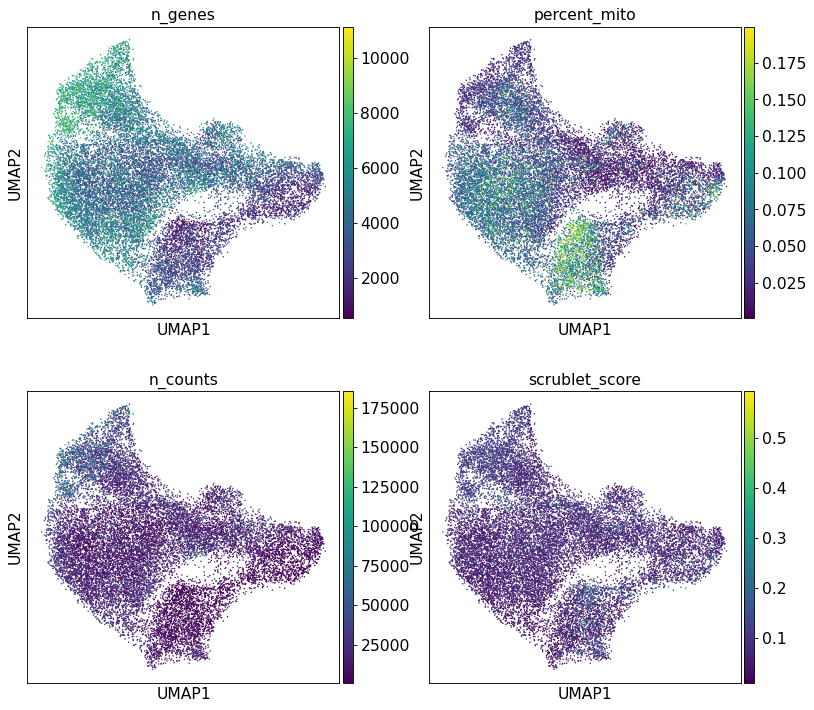

In [42]:
sc.pl.umap(Endo, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score' ], ncols=2, size=7)

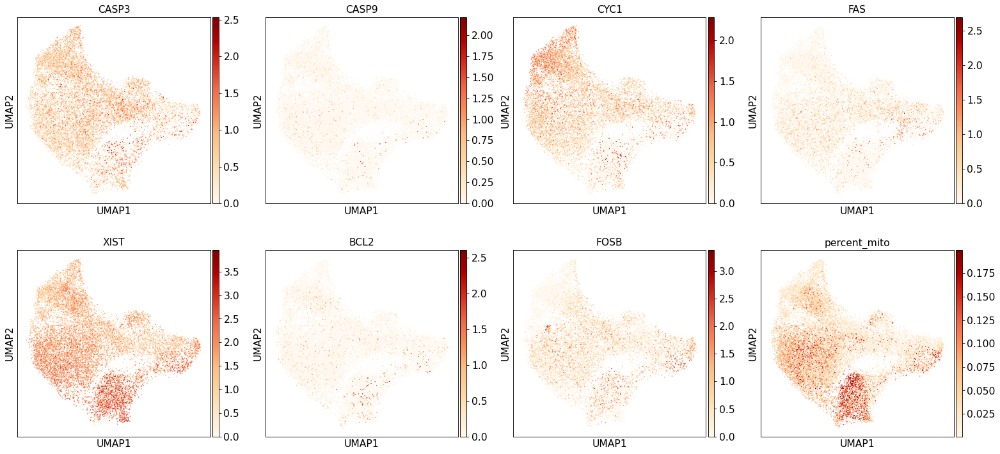

In [43]:
sc.pl.umap(Endo, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2','FOSB','percent_mito'],
           color_map='OrRd', size=7)

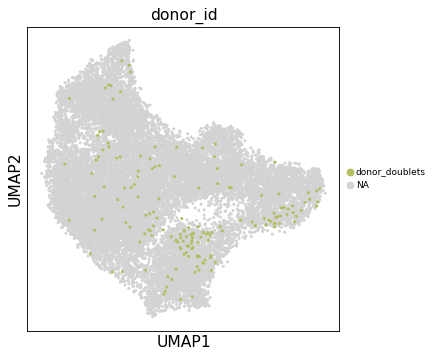

In [44]:
sc.pl.umap(Endo, color=['donor_id' ], legend_fontsize='xx-small', size=30, ncols=2, groups=['donor_doublets'], )

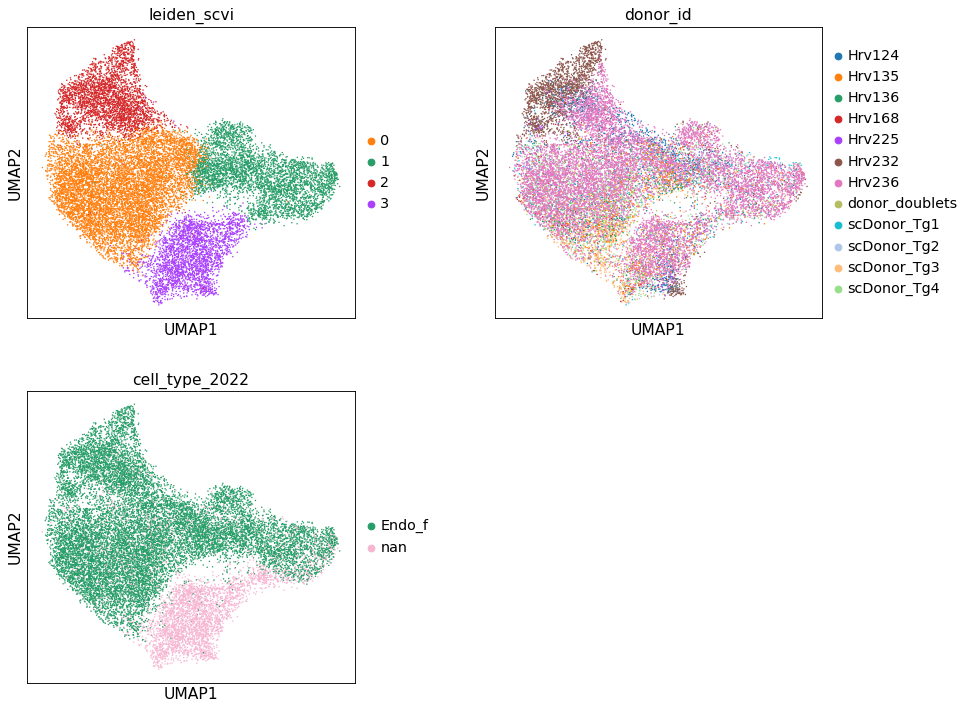

In [45]:
sc.pl.umap(Endo, color=["leiden_scvi",'donor_id','cell_type_2022'], ncols=2, wspace=0.3, size=7)

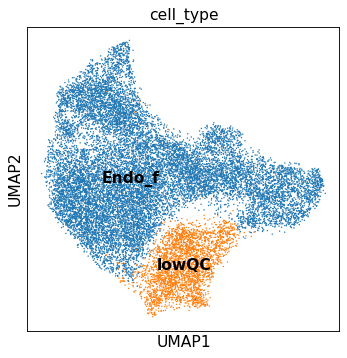

In [46]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
Endo.obs['cell_type']= Endo.obs['leiden_scvi']


#Function that changes the cluster names as indicated
Endo.obs['cell_type'] = (Endo.obs["leiden_scvi"].map(lambda x: 
                            {"0": "Endo_f", "1": "Endo_f", "2": "Endo_f", "3": "lowQC"}
                            .get(x, x)).astype("category"))


sc.pl.umap(Endo, color=['cell_type'], wspace=0.3, legend_loc='on data')

### Transferring annotation

In [47]:
FibroEndo= identityTransfer(Fibro, FibroEndo)

In [48]:
FibroEndo= identityTransfer(Endo, FibroEndo)

In [49]:
del(Fibro, Endo)
gc.collect()

125269

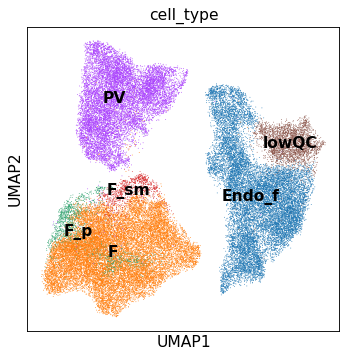

In [50]:
sc.pl.umap(FibroEndo, color=['cell_type'], wspace=0.3, legend_loc='on data')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:18)


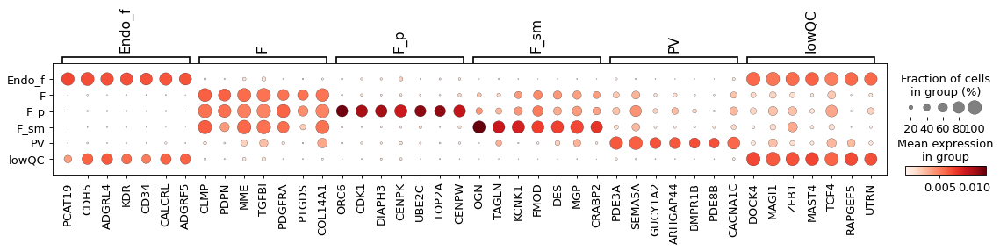

In [63]:
FibroEndo_TFidf= runTF_IDF(FibroEndo, groupby='cell_type', method='wilcoxon')

sc.pl.rank_genes_groups_dotplot(FibroEndo_TFidf, n_genes=7, dendrogram=False,)

In [51]:
adata= identityTransfer(FibroEndo, adata)

In [52]:
del(FibroEndo)
gc.collect()

3254

In [53]:
adata = adata[adata.obs['cell_type'] != 'lowQC']
adata = adata[adata.obs['cell_type'] != 'doublets']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [54]:
#DF with the row names as the identity of the cells
colors_final_df = pd.DataFrame(index = np.unique(adata.obs['cell_type']))


#Assign each color per cell type under the column color

#colors_final_df.loc['SCT', 'color'] = '#f779a3'
colors_final_df.loc['VCT', 'color'] = '#b27ab4'
colors_final_df.loc['VCT_fusing', 'color'] = '#b53179'
colors_final_df.loc['VCT_p', 'color'] = '#993f98'
colors_final_df.loc['VCT_CCC', 'color'] = '#e2a7c8'

colors_final_df.loc['iEVT', 'color'] = '#0069b4'
colors_final_df.loc['EVT_1', 'color'] = '#009999'
colors_final_df.loc['EVT_2', 'color'] = '#03f9f2'


colors_final_df.loc['Endo_f', 'color'] = '#3f752d'
colors_final_df.loc['F', 'color'] = '#6bb300'
colors_final_df.loc['F_p', 'color'] = '#91A376'
colors_final_df.loc['F_sm', 'color'] = '#40C232'

colors_final_df.loc['PV', 'color'] = '#d6ff99'



colors_final_df.loc['HBC', 'color'] = '#db5669'
colors_final_df.loc['PAMM1', 'color'] = '#f7e55e'

colors_final_dict= colors_final_df.to_dict()['color']

Trying to set attribute `.uns` of view, copying.


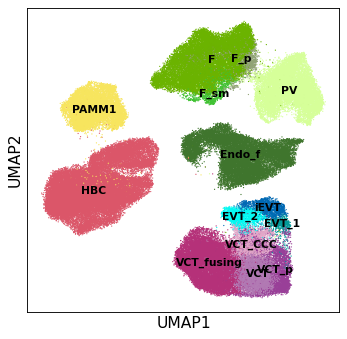

In [55]:
sc.pl.umap(adata, color=['cell_type'], size=5,
           palette= colors_final_dict, title='', legend_loc='on data',legend_fontsize='x-small')

In [56]:
adata

AnnData object with n_obs × n_vars = 121349 × 36601
    obs: 'sample', 'stage', 'hpi', 'infection', 'percent_mito', 'n_counts', 'sample_barcode', 'assignment_SoC', 'donor_id', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'S_score', 'G2M_score', 'phase', 'n_genes_by_counts', 'total_counts', 'total_counts_hs', 'pct_counts_hs', 'total_counts_tg', 'pct_counts_tg', 'Tg_infected', 'n_genes', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_scvi', 'celltype_predictions', 'probabilities', 'scrublet_doublet', 'cell_type_2022', 'cell_type', 'souporcell_MFgenotype', 'MFgenotype', 'cell_type_broad', 'umap_density_Tg_infected', 'stage_perInfection', 'celltype-Stage', 'Tg_intracellular', 'celltype-Intracellular'
    var: 'gene_ids', 'feature_types', 'mean-0', 'std-0', 'mean-1', 'std-1', 'mean-2', 'std-2', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'MFgenotype_colors', '_scvi', 'cell_type

### Saving the data

In [57]:
del(adata.raw)

In [58]:
adata.X= adata.layers['raw_counts'].copy()

In [59]:
adata.write('../results/scVI/rna7_scVIintegrated_latent30_All_20230707.h5ad')